# 导入相关库

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import time
from datetime import datetime

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import StratifiedKFold

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn import metrics
import numpy as np
import pickle as pkl

from imblearn.over_sampling import SMOTE, ADASYN
from bayes_opt import BayesianOptimization

In [7]:
df = pd.read_csv('./data/US_Accidents_June20.csv', encoding='utf-8')

In [8]:
df.columns

Index(['ID', 'Source', 'TMC', 'Severity', 'Start_Time', 'End_Time',
       'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)',
       'Description', 'Number', 'Street', 'Side', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

# 数据EDA

In [9]:
# 按照年份将数据拆开
df["time"]=pd.to_datetime(df.Start_Time, format='%Y-%m-%d %H:%M:%S') 
pd.DatetimeIndex(df["time"]).year.value_counts()

2019    953733
2018    892615
2017    717489
2020    539187
2016    410593
Name: time, dtype: int64

In [10]:
df['year'] = df['time'].apply(lambda x:x.year)
df_2016 = df[df['year']==2016]
df_2017 = df[df['year']==2017]
df_2018 = df[df['year']==2018]
df_2019 = df[df['year']==2019]
df_2020 = df[df['year']==2020]

In [8]:
df_2016.to_csv('./data/2016.csv', encoding='utf-8-sig',index=False)
df_2017.to_csv('./data/2017.csv', encoding='utf-8-sig',index=False)
df_2018.to_csv('./data/2018.csv', encoding='utf-8-sig',index=False)
df_2019.to_csv('./data/2019.csv', encoding='utf-8-sig',index=False)
df_2020.to_csv('./data/2020.csv', encoding='utf-8-sig',index=False)

## 统计16~20每年的事故数量

Text(0.5, 1.02, 'year & counts of accident')

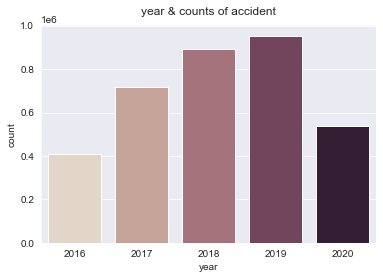

In [11]:
sns.set_style('darkgrid')
ax = sns.countplot(x="year", palette="ch:.25", data=df)
# ax = sns.catplot(x="year", kind="count", , data=data_all)
ax.set_title('year & counts of accident', position=(0.5,1.02))

## 统计16.02~20.06每月的事故数量

In [12]:
# 开始统计按照年份-月份的事故数量
from datetime import datetime
def get_year_month(time):
    time = str(time)
    time = time[:7]
#     time = datetime.strptime(time, '%Y-%m')
    return time

df['year-month'] = df['time'].apply(lambda x:get_year_month(x))

[Text(0, 0, '2016-02'),
 Text(0, 0, '2016-03'),
 Text(0, 0, '2016-04'),
 Text(0, 0, '2016-05'),
 Text(0, 0, '2016-06'),
 Text(0, 0, '2016-07'),
 Text(0, 0, '2016-08'),
 Text(0, 0, '2016-09'),
 Text(0, 0, '2016-10'),
 Text(0, 0, '2016-11'),
 Text(0, 0, '2016-12'),
 Text(0, 0, '2017-01'),
 Text(0, 0, '2017-02'),
 Text(0, 0, '2017-03'),
 Text(0, 0, '2017-04'),
 Text(0, 0, '2017-05'),
 Text(0, 0, '2017-06'),
 Text(0, 0, '2017-07'),
 Text(0, 0, '2017-08'),
 Text(0, 0, '2017-09'),
 Text(0, 0, '2017-10'),
 Text(0, 0, '2017-11'),
 Text(0, 0, '2017-12'),
 Text(0, 0, '2018-01'),
 Text(0, 0, '2018-02'),
 Text(0, 0, '2018-03'),
 Text(0, 0, '2018-04'),
 Text(0, 0, '2018-05'),
 Text(0, 0, '2018-06'),
 Text(0, 0, '2018-07'),
 Text(0, 0, '2018-08'),
 Text(0, 0, '2018-09'),
 Text(0, 0, '2018-10'),
 Text(0, 0, '2018-11'),
 Text(0, 0, '2018-12'),
 Text(0, 0, '2019-01'),
 Text(0, 0, '2019-02'),
 Text(0, 0, '2019-03'),
 Text(0, 0, '2019-04'),
 Text(0, 0, '2019-05'),
 Text(0, 0, '2019-06'),
 Text(0, 0, '201

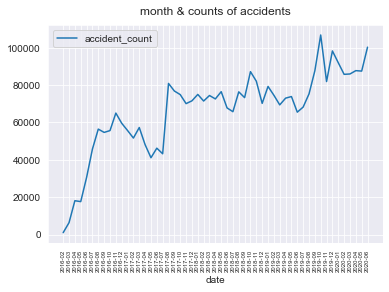

In [13]:
year_month_num = pd.DataFrame(df['year-month'].value_counts())
year_month_num['date'] = year_month_num.index
year_month_num.rename(columns={'year-month':'accident_count'},inplace=True)
year_month_num = year_month_num.sort_values('date')
year_month_num = year_month_num.set_index('date')


# sns.set_style('dark')
ax = sns.lineplot(data=year_month_num, color="coral")
ax.set_title('month & counts of accidents', position=(0.5,1.02))
ax.set_xticklabels(year_month_num.index, rotation=90, fontsize=6)


## 统计每年每字段的缺失值数量占比

In [19]:
# 绘制5年，每年、每类别的缺失值占当年总数量的占比

missing_data_2016 = pd.DataFrame(df_2016.isnull().sum())
missing_data_2016['percent'] = missing_data_2016[0].apply(lambda x:round(x/df_2016.shape[0],2))
missing_data_2016 = missing_data_2016.rename(columns={0:'num'})

missing_data_2017 = pd.DataFrame(df_2017.isnull().sum())
missing_data_2017['percent'] = missing_data_2017[0].apply(lambda x:round(x/df_2017.shape[0],2))
missing_data_2017 = missing_data_2017.rename(columns={0:'num'})

missing_data_2018 = pd.DataFrame(df_2018.isnull().sum())
missing_data_2018['percent'] = missing_data_2018[0].apply(lambda x:round(x/df_2018.shape[0],2))
missing_data_2018 = missing_data_2018.rename(columns={0:'num'})

missing_data_2019 = pd.DataFrame(df_2019.isnull().sum())
missing_data_2019['percent'] = missing_data_2019[0].apply(lambda x:round(x/df_2019.shape[0],2))
missing_data_2019 = missing_data_2019.rename(columns={0:'num'})

missing_data_2020 = pd.DataFrame(df_2020.isnull().sum())
missing_data_2020['percent'] = missing_data_2020[0].apply(lambda x:round(x/df_2020.shape[0],2))
missing_data_2020 = missing_data_2020.rename(columns={0:'num'})

In [27]:
# 将上面的数据进行转换
# 2016年
missing_data_2016 = missing_data_2016[missing_data_2016['percent']!=0]
missing_data_2016['year'] = pd.DataFrame({'year':[2016]*missing_data_2016.shape[0]})
missing_data_2016['year'] = missing_data_2016['year'].fillna('2016')

# 2017年
missing_data_2017 = missing_data_2017[missing_data_2017['percent']!=0]
missing_data_2017['year'] = pd.DataFrame({'year':[2017]*missing_data_2017.shape[0]})
missing_data_2017['year'] = missing_data_2017['year'].fillna('2017')

missing_data_2018 = missing_data_2018[missing_data_2018['percent']!=0]
missing_data_2018['year'] = pd.DataFrame({'year':[2018]*missing_data_2018.shape[0]})
missing_data_2018['year'] = missing_data_2018['year'].fillna('2018')

missing_data_2019 = missing_data_2019[missing_data_2019['percent']!=0]
missing_data_2019['year'] = pd.DataFrame({'year':[2019]*missing_data_2019.shape[0]})
missing_data_2019['year'] = missing_data_2019['year'].fillna('2019')

missing_data_2020 = missing_data_2020[missing_data_2020['percent']!=0]
missing_data_2020['year'] = pd.DataFrame({'year':[2020]*missing_data_2020.shape[0]})
missing_data_2020['year'] = missing_data_2020['year'].fillna('2020')

<ipython-input-27-af2fbc518235>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing_data_2017['year'] = pd.DataFrame({'year':[2017]*missing_data_2017.shape[0]})
<ipython-input-27-af2fbc518235>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing_data_2017['year'] = missing_data_2017['year'].fillna('2017')
<ipython-input-27-af2fbc518235>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [28]:
data_missing_all = pd.concat([missing_data_2016, missing_data_2017, missing_data_2018, 
                             missing_data_2019, missing_data_2020], axis=0)
data_missing_all['feature'] = data_missing_all.index

[Text(0, 0, 'TMC'),
 Text(0, 0, 'End_Lat'),
 Text(0, 0, 'End_Lng'),
 Text(0, 0, 'Number'),
 Text(0, 0, 'Weather_Timestamp'),
 Text(0, 0, 'Temperature(F)'),
 Text(0, 0, 'Wind_Chill(F)'),
 Text(0, 0, 'Humidity(%)'),
 Text(0, 0, 'Pressure(in)'),
 Text(0, 0, 'Visibility(mi)'),
 Text(0, 0, 'Wind_Direction'),
 Text(0, 0, 'Wind_Speed(mph)'),
 Text(0, 0, 'Precipitation(in)'),
 Text(0, 0, 'Weather_Condition')]

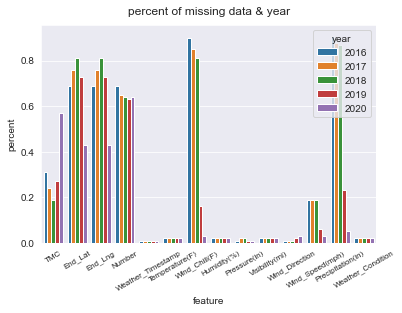

In [30]:
# 绘制图像
ax=sns.barplot(x="feature", y="percent", hue="year", data=data_missing_all)
ax.set_title('percent of missing data & year', position=(0.5,1.02))
ax.set_xticklabels(data_missing_all.feature, rotation=30, fontsize=8)

## 统计16~20每年的各严重事故占比

In [50]:
severity_16 = pd.DataFrame(df_2016['Severity'].value_counts())
severity_16['percent'] = (severity_16['Severity']/df_2016.shape[0]).apply(lambda x: round(x, 3))
severity_16['severity'] = severity_16.index
severity_16['year'] = [2016]*4

severity_17 = pd.DataFrame(df_2017['Severity'].value_counts())
severity_17['percent'] = (severity_17['Severity']/df_2017.shape[0]).apply(lambda x: round(x, 3))
severity_17['severity'] = severity_17.index
severity_17['year'] = [2017]*4

severity_18 = pd.DataFrame(df_2018['Severity'].value_counts())
severity_18['percent'] = (severity_18['Severity']/df_2018.shape[0]).apply(lambda x: round(x, 3))
severity_18['severity'] = severity_18.index
severity_18['year'] = [2018]*4

severity_19 = pd.DataFrame(df_2019['Severity'].value_counts())
severity_19['percent'] = (severity_19['Severity']/df_2019.shape[0]).apply(lambda x: round(x, 3))
severity_19['severity'] = severity_19.index
severity_19['year'] = [2019]*4

severity_20 = pd.DataFrame(df_2020['Severity'].value_counts())
severity_20['percent'] = (severity_20['Severity']/df_2020.shape[0]).apply(lambda x: round(x, 3))
severity_20['severity'] = severity_20.index
severity_20['year'] = [2020]*4

In [53]:
# 将以上数据进行拼接
severity_percent = pd.concat([severity_16, severity_17, severity_18, severity_19, severity_20], axis=0)

Text(0.5, 1.02, 'percent of severity & year')

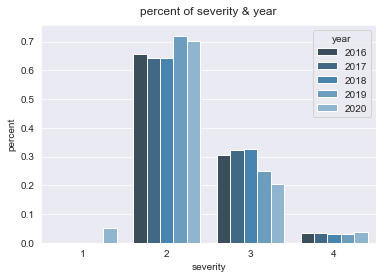

In [57]:
# 绘制图像
ax = sns.barplot(x='severity',y='percent', hue='year', data=severity_percent, palette='Blues_d')
ax.set_title('percent of severity & year', position=(0.5,1.02))

# 事故严重程度预测建模_基于2019年数据

## 各严重程度事故占比

Text(0.5, 1.02, 'percent of severity for data_2019')

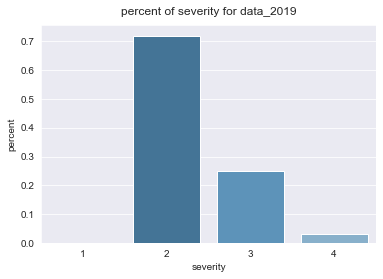

In [61]:
# 绘制2019年各严重程度的占比
severity_per = pd.DataFrame(df_2019['Severity'].value_counts())
severity_per['percent'] = severity_per['Severity'].apply(lambda x:round(x/df_2019.shape[0],2))
severity_per = severity_per.rename(columns={'Severity':'num'})
severity_per['severity'] = severity_per.index

ax = sns.barplot(x="severity", y="percent", data=severity_per, palette='Blues_d')
ax.set_title('percent of severity for data_2019', position=(0.5,1.02))

## 绘制随机点地图

In [62]:
# 绘制事故点地图
import folium
# 这里使用folium库画美国地图
incidents = folium.map.FeatureGroup()
datasample=df_.sample(10000) 
# Loop through the 200 crimes and add each to the incidents feature group
for lat, lng, in zip(datasample.Start_Lat,datasample.Start_Lng):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='red',
            fill_opacity=0.4
        )
    )

# Add incidents to map
US_map = folium.Map(location=[38, -100], zoom_start=4)
US_map.add_child(incidents)


In [63]:
US_map.save('pointMap_sample2019.html')

## 绘制随机点热力图

In [65]:
# 绘制热力图
from folium.plugins import HeatMap
san_map = folium.Map(location=[38, -100], zoom_start=4)
# Convert data format
datasample=df_2019.sample(1000) 
heatdata = datasample[['Start_Lat','Start_Lng']].values.tolist()

# add incidents to map
HeatMap(heatdata).add_to(san_map)
san_map

In [66]:
san_map.save('heatMap_sample2019.html')

## 绘制16~20每年的事故经纬度散点图

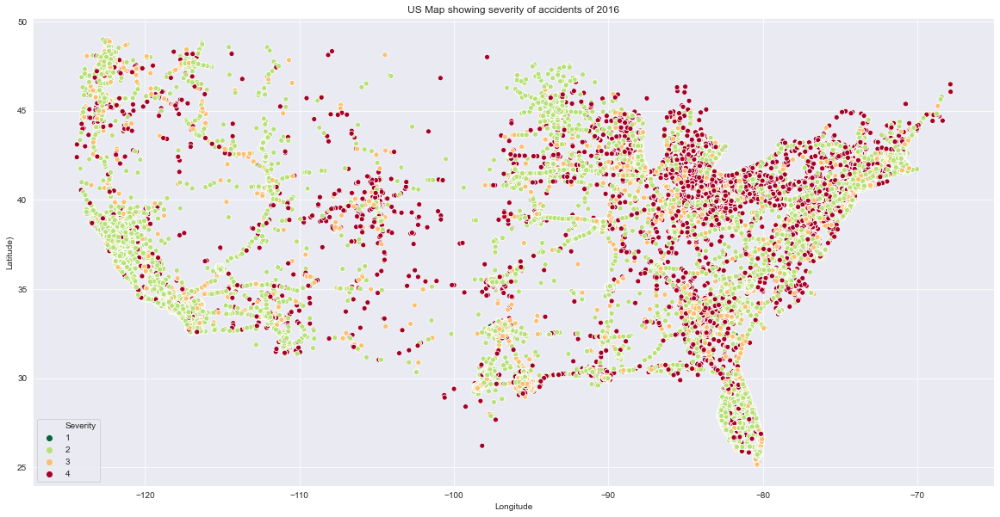

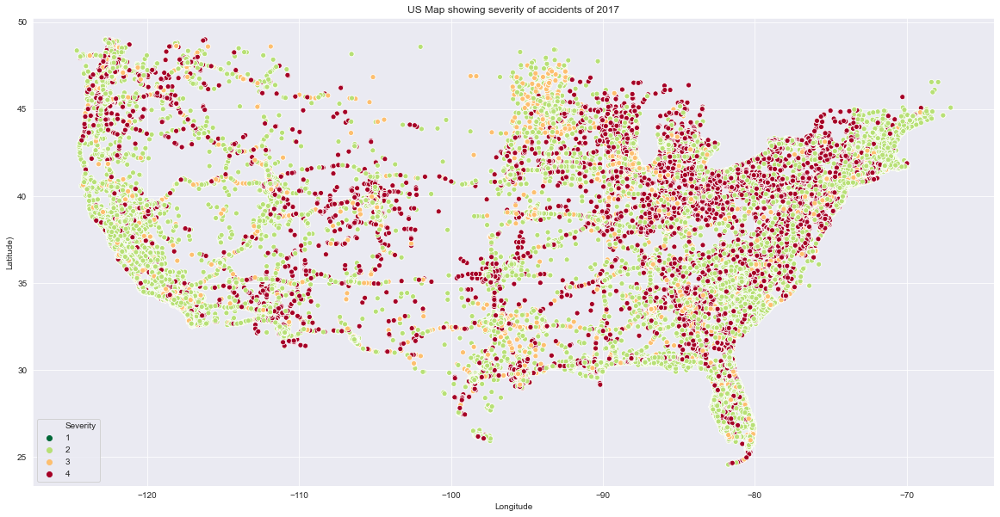

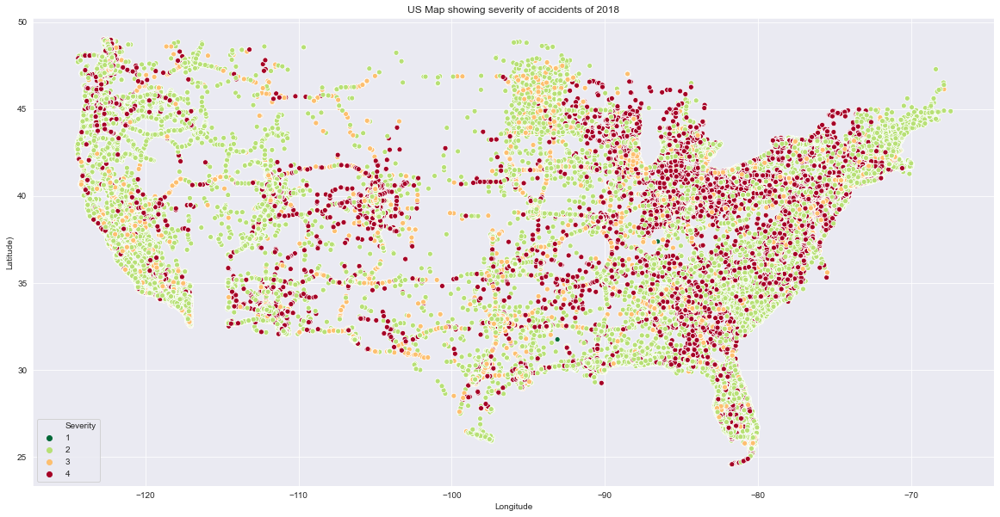

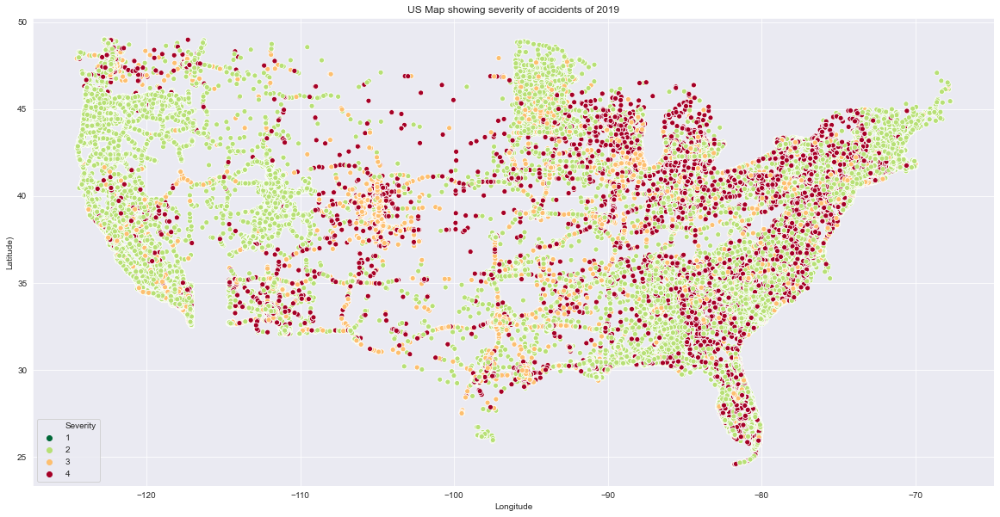

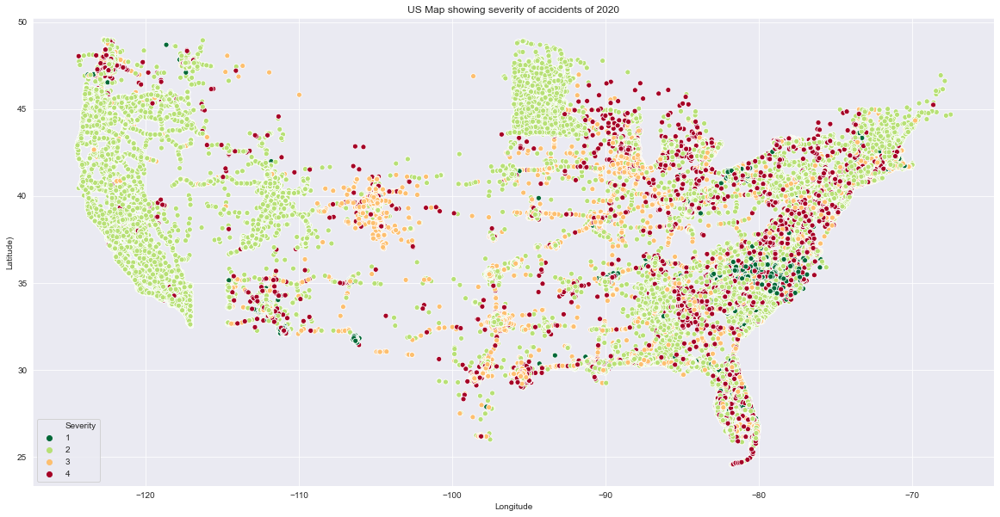

In [68]:
datas = [df_2016, df_2017, df_2018, df_2019, df_2020]

for i in range(len(datas)):
    data = datas[i]
    year = 2016+i
    
    fig,ax=plt.subplots(1,figsize=(20,10))
    sns.scatterplot(x='Start_Lng', y='Start_Lat', data=data, hue='Severity',palette='RdYlGn_r',ax=ax)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude)')
    ax.set_title('US Map showing severity of accidents of ' + str(year))
    plt.savefig('Map showing severity of accidents of ' + str(year) + '.png')

## 绘制事故发生量最多的州

In [70]:
# 绘制发生事故最多的州
df_2019['State'].value_counts()

CA    213362
TX     78709
FL     60305
SC     58991
NC     45992
NY     42936
OR     41172
MN     29524
VA     25702
UT     24616
AZ     24528
GA     23712
TN     21131
OK     20482
MI     20350
PA     20100
IL     19961
AL     19239
LA     18976
CO     17588
WA     14688
OH     13233
NJ     13003
MD     12451
MA      9344
MO      9127
IN      7767
WI      6889
KY      6832
CT      5455
NE      4642
NV      3002
RI      2973
IA      2842
NH      2218
KS      1995
MS      1985
DE      1620
NM      1616
DC      1484
AR       991
ME       636
ID       554
WV       473
VT       224
MT       157
WY       112
SD        27
ND        17
Name: State, dtype: int64

In [72]:
# 用2019年的数据画美国地图
state_geo = f'./data/us-states.json'
state_csv = f'./data/chore_data.csv'

state_data = pd.read_csv(state_csv, encoding='utf-8')

m = folium.Map(
    location=[38, -100],
    zoom_start=4,
)

folium.Choropleth(
    state_geo,
    data=state_data,
    columns=['STATE', 'accident_counts/km*km'],
    key_on='feature.id',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.51,
    legend_name='accident_counts',
    bins=[0, 0.1, 0.2, 0.5, 0.6, 0.7, 0.8, 1.0]
).add_to(m)
m

In [73]:
m.save('2019_state&accident_count.html')

[Text(0, 0, 'CA'),
 Text(0, 0, 'TX'),
 Text(0, 0, 'FL'),
 Text(0, 0, 'SC'),
 Text(0, 0, 'NC'),
 Text(0, 0, 'NY'),
 Text(0, 0, 'OR'),
 Text(0, 0, 'MN'),
 Text(0, 0, 'VA'),
 Text(0, 0, 'UT'),
 Text(0, 0, 'AZ'),
 Text(0, 0, 'GA'),
 Text(0, 0, 'TN'),
 Text(0, 0, 'OK'),
 Text(0, 0, 'MI'),
 Text(0, 0, 'PA'),
 Text(0, 0, 'IL'),
 Text(0, 0, 'AL'),
 Text(0, 0, 'LA'),
 Text(0, 0, 'CO'),
 Text(0, 0, 'WA'),
 Text(0, 0, 'OH'),
 Text(0, 0, 'NJ'),
 Text(0, 0, 'MD'),
 Text(0, 0, 'MA'),
 Text(0, 0, 'MO'),
 Text(0, 0, 'IN'),
 Text(0, 0, 'WI'),
 Text(0, 0, 'KY'),
 Text(0, 0, 'CT'),
 Text(0, 0, 'NE'),
 Text(0, 0, 'NV'),
 Text(0, 0, 'RI'),
 Text(0, 0, 'IA'),
 Text(0, 0, 'NH'),
 Text(0, 0, 'KS'),
 Text(0, 0, 'MS'),
 Text(0, 0, 'DE'),
 Text(0, 0, 'NM'),
 Text(0, 0, 'DC'),
 Text(0, 0, 'AR'),
 Text(0, 0, 'ME'),
 Text(0, 0, 'ID'),
 Text(0, 0, 'WV'),
 Text(0, 0, 'VT'),
 Text(0, 0, 'MT'),
 Text(0, 0, 'WY'),
 Text(0, 0, 'SD'),
 Text(0, 0, 'ND')]

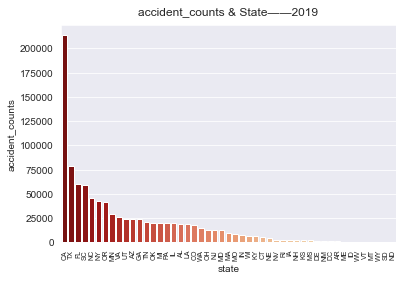

In [75]:
state_accidentCounts = pd.DataFrame(df_2019['State'].value_counts())
state_accidentCounts['state'] = state_accidentCounts.index
state_accidentCounts = state_accidentCounts.rename(columns={'State':'accident_counts'})
sns.set_style('darkgrid')
ax = sns.barplot(x="state", y="accident_counts", data=state_accidentCounts, palette='OrRd_r')
ax.set_title('accident_counts & State——2019', position=(0.5,1.02))
ax.set_xticklabels(state_accidentCounts.state, rotation=90, fontsize=7)

## 绘制基于月份-工作日-小时维度的事故数量热力图

### 月份-工作日

In [14]:
df_2019.shape

(953733, 51)

In [82]:
def get_week_day(date):
    week_day_dict = {
    0 : 'Monday',
    1 : 'Tuesday',
    2 : 'Wednesday',
    3 : 'Thursday',
    4 : 'Friday',
    5 : 'Saturday',
    6 : 'Sunday',
  }
    day = date.weekday()
    return week_day_dict[day]

# def get_weekday(time):
#     time = datetime.strptime(time, '%Y-%m-%d %H:%M:%S')
#     return get_week_day(time)

df_2019['weekday'] = df_2019['time'].apply(lambda x:get_week_day(x))
df_2019['month'] = pd.DatetimeIndex(df_2019["time"]).month

<ipython-input-82-4e75b90086d3>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2019['weekday'] = df_2019['time'].apply(lambda x:get_week_day(x))
<ipython-input-82-4e75b90086d3>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2019['month'] = pd.DatetimeIndex(df_2019["time"]).month


In [80]:
month_weekday_2019 = df_2019[['weekday','month']]
month_weekday_2019

,weekday,month
641495,Thursday,12
641496,Thursday,12
740268,Tuesday,12
740270,Tuesday,12
740335,Tuesday,12
...,...,...
3513612,Friday,8
3513613,Friday,8
3513614,Friday,8
3513615,Friday,8


In [84]:
heatmap_data1 = month_weekday_2019.groupby(['weekday','month'])
weekday = []
month = []
num = []
for name, group in heatmap_data1:
    weekday.append(name[0])
    month.append(name[1])
    num.append(group.shape[0])

df = pd.DataFrame({
    'weekday':weekday,
    'month':month,
    'num':num
})
# df.to_csv('weekday_month_heatmapData.csv', encoding='utf-8-sig')

In [85]:
df

,weekday,month,num
0,Friday,1,12366
1,Friday,2,12795
2,Friday,3,14692
3,Friday,4,12290
4,Friday,5,14444
...,...,...,...
79,Wednesday,8,12469
80,Wednesday,9,14166
81,Wednesday,10,19996
82,Wednesday,11,14537


In [86]:
raw_data = pd.DataFrame(index=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
                        columns=set(list(df['month'])))
for i in df.index:
    res = df.loc[i]
    raw_data[res['month']][res['weekday']] = int(res['num'])

raw_data = raw_data.rename(columns={1:'1',2:'2',3:'3',4:'4',5:'5',6:'6',7:'7',8:'8',9:'9',
                                   10:'10',11:'11',12:'12'})
for i in range(1,13):
    raw_data[str(i)] = pd.Series(raw_data[str(i)]).astype(int)

In [87]:
raw_data

,1,2,3,4,5,6,7,8,9,10,11,12
Monday,11976,12997,10533,14468,10270,11150,13410,11132,16797,15240,13228,18568
Tuesday,14330,13490,11553,14990,11633,11453,13397,12741,15476,20416,14269,17513
Wednesday,15678,13704,12015,11809,14680,10719,13805,12469,14166,19996,14537,14744
Thursday,16228,13167,11346,11813,14858,11198,9535,15476,12420,20802,11714,15079
Friday,12366,12795,14692,12290,14444,11306,10548,15441,15253,16375,17115,15779
Saturday,4644,4434,4924,4114,3987,5111,3789,4553,6721,7682,6425,8138
Sunday,4054,3972,4338,3517,3992,4564,3750,3434,6826,6306,4606,8460


Text(0.5, 1.02, 'Accident Count for Different Days/Months——2019')

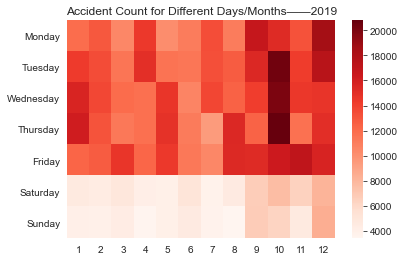

In [94]:
sns.set_style('dark')
ax = sns.heatmap(raw_data, cmap="Reds")
ax.set_title('Accident Count for Different Days/Months——2019', position=(0.5,1.02))

### 工作日-小时

In [95]:
# 开始绘制天数与小时的热力图
df_2019['hour'] = pd.DatetimeIndex(df_2019["time"]).hour

<ipython-input-95-c303650b53e8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2019['hour'] = pd.DatetimeIndex(df_2019["time"]).hour


In [100]:
weekday_hour_2019 = df_2019[['weekday','hour']]
heatmap_data1 = weekday_hour_2019.groupby(['weekday','hour'])
weekday = []
hour = []
num = []
for name, group in heatmap_data1:
    weekday.append(name[0])
    hour.append(name[1])
    num.append(group.shape[0])

df = pd.DataFrame({
    'weekday':weekday,
    'hour':hour,
    'num':num
})
# df.to_csv('weekday_hour_heatmapData.csv', encoding='utf-8-sig')
raw_data = pd.DataFrame(index=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
                        columns=set(list(df['hour'])))
for i in df.index:
    res = df.loc[i]
    raw_data[res['hour']][res['weekday']] = int(res['num'])

[Text(0.5, 0, '0'),
 Text(1.5, 0, '1'),
 Text(2.5, 0, '2'),
 Text(3.5, 0, '3'),
 Text(4.5, 0, '4'),
 Text(5.5, 0, '5'),
 Text(6.5, 0, '6'),
 Text(7.5, 0, '7'),
 Text(8.5, 0, '8'),
 Text(9.5, 0, '9'),
 Text(10.5, 0, '10'),
 Text(11.5, 0, '11'),
 Text(12.5, 0, '12'),
 Text(13.5, 0, '13'),
 Text(14.5, 0, '14'),
 Text(15.5, 0, '15'),
 Text(16.5, 0, '16'),
 Text(17.5, 0, '17'),
 Text(18.5, 0, '18'),
 Text(19.5, 0, '19'),
 Text(20.5, 0, '20'),
 Text(21.5, 0, '21'),
 Text(22.5, 0, '22'),
 Text(23.5, 0, '23')]

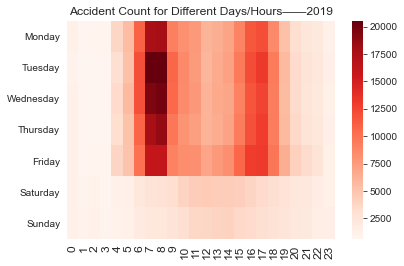

In [107]:
for i in range(24):
    raw_data[i] = pd.Series(raw_data[i]).astype(int)

# sns.set_style('dark')
ax = sns.heatmap(raw_data, cmap="Reds")
ax.set_title('Accident Count for Different Days/Hours——2019', position=(0.5,1.02))
ax.set_xticklabels(raw_data.columns, rotation=90, fontsize=12)

## 建模预测严重程度

### 字段预删除

In [109]:
model2019 = df_2019.copy()

In [110]:
droplist = ['ID', 'Source', 'TMC', 'Start_Time','End_Time', 'End_Lat','End_Lng','Description','Number','Street',
            'Side','City','County','State','Zipcode','Country','Timezone', 'Airport_Code','Weather_Timestamp',
            'Sunrise_Sunset','Civil_Twilight','Nautical_Twilight', 'Astronomical_Twilight','year']
model2019 = model2019.drop(droplist, axis=1)

In [112]:
list(model2019)

['Severity',
 'Start_Lat',
 'Start_Lng',
 'Distance(mi)',
 'Temperature(F)',
 'Wind_Chill(F)',
 'Humidity(%)',
 'Pressure(in)',
 'Visibility(mi)',
 'Wind_Direction',
 'Wind_Speed(mph)',
 'Precipitation(in)',
 'Weather_Condition',
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal',
 'Turning_Loop',
 'time',
 'weekday',
 'month',
 'hour']

In [113]:
model2019.isnull().sum()

Severity                  0
Start_Lat                 0
Start_Lng                 0
Distance(mi)              0
Temperature(F)        17137
Wind_Chill(F)        149198
Humidity(%)           18219
Pressure(in)          13747
Visibility(mi)        18435
Wind_Direction        19926
Wind_Speed(mph)       60043
Precipitation(in)    219097
Weather_Condition     18237
Amenity                   0
Bump                      0
Crossing                  0
Give_Way                  0
Junction                  0
No_Exit                   0
Railway                   0
Roundabout                0
Station                   0
Stop                      0
Traffic_Calming           0
Traffic_Signal            0
Turning_Loop              0
time                      0
weekday                   0
month                     0
hour                      0
dtype: int64

In [246]:
model2019['weekday']

641495     Thursday
641496     Thursday
740268      Tuesday
740270      Tuesday
740335      Tuesday
             ...   
3513612      Friday
3513613      Friday
3513614      Friday
3513615      Friday
3513616      Friday
Name: weekday, Length: 953733, dtype: object

### 缺失值处理

In [114]:
# 类别型缺失值用众数填充
model2019['Wind_Direction'] = model2019['Wind_Direction'].fillna('CALM')
model2019['Weather_Condition'] = model2019['Weather_Condition'].fillna('Fair')

# 连续型变量缺失值填充
#温度湿度气压能见度用均值填补
model2019['Temperature(F)'] = model2019['Temperature(F)'].fillna(model2019['Temperature(F)'].mean())
model2019['Wind_Chill(F)'] = model2019['Wind_Chill(F)'].fillna(model2019['Wind_Chill(F)'].mean())
model2019['Humidity(%)'] = model2019['Humidity(%)'].fillna(model2019['Humidity(%)'].mean())
model2019['Pressure(in)'] = model2019['Pressure(in)'].fillna(model2019['Pressure(in)'].mean())
model2019['Visibility(mi)'] = model2019['Visibility(mi)'].fillna(model2019['Visibility(mi)'].mean())
#风速使用近邻填补
model2019['Wind_Speed(mph)'] = model2019['Wind_Speed(mph)'].interpolate(method='nearest', order=4)

#降水量没有就用0填补
model2019['Precipitation(in)'] = model2019['Precipitation(in)'].fillna(0)
#风向，把同样含义单词的合并起来
occupation = {"CALM":"Calm", "N":"North", "S":"South", "W":"West", "E":"East", "VAR":"Variable"}
f = lambda x : occupation.get(x,x) #在occupation中找对应的值
model2019['Wind_Direction']= model2019['Wind_Direction'].map(f)

### 连续型变量EDA

#### Distance(mi)

Text(0.5, 1.02, 'Distance(mi) & Severity——boxen_figure')

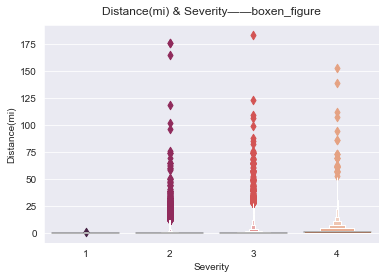

In [131]:
# 绘制Distance的增强箱型图
sns.set_style('darkgrid')
ax = sns.boxenplot(x="Severity", y="Distance(mi)", data=model2019.sort_values("Severity"), palette='rocket')
ax.set_title('Distance(mi) & Severity——boxen_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Distance(mi) & Severity——KDE_figure')

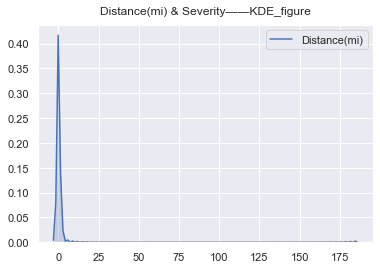

In [160]:
ax = sns.kdeplot(model2019['Distance(mi)'],shade=True, bw=1.02)
ax.set_title('Distance(mi) & Severity——KDE_figure', position=(0.5,1.02)) 

#### Temperature(F)

Text(0.5, 1.02, 'Temperature(F) & Severity——boxen_figure')

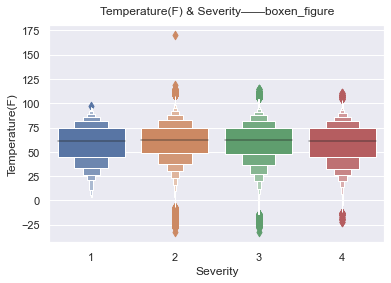

In [146]:
ax = sns.boxenplot(x="Severity", y="Temperature(F)", data=model2019.sort_values("Severity"))
ax.set_title('Temperature(F) & Severity——boxen_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Temperature(F) & Severity——violin_figure')

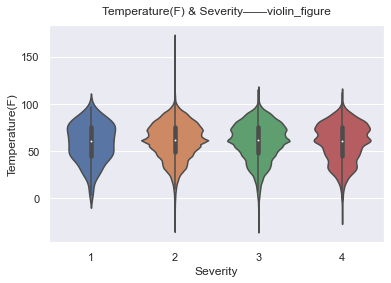

In [147]:
ax = sns.violinplot(x="Severity", y="Temperature(F)", 
               data=model2019.sort_values("Severity"))
ax.set_title('Temperature(F) & Severity——violin_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Temperature(F) & Severity——KDE_figure')

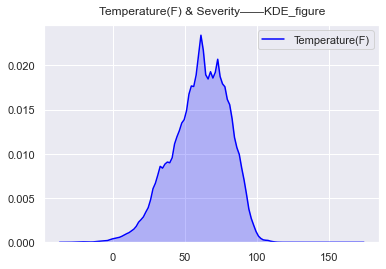

In [148]:
ax = sns.kdeplot(model2019['Temperature(F)'], shade=True, color="blue")
ax.set_title('Temperature(F) & Severity——KDE_figure', position=(0.5,1.02))

#### Humidity(%)

Text(0.5, 1.02, 'Humidity(%) & Severity——violin_figure')

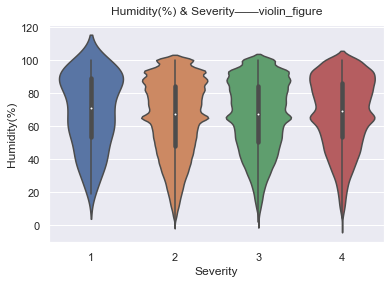

In [149]:
ax = sns.violinplot(x="Severity", y="Humidity(%)", data=model2019.sort_values("Severity"))
ax.set_title('Humidity(%) & Severity——violin_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Humidity(%) & Severity——KDE_figure')

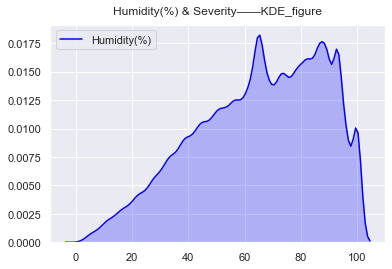

In [150]:
ax = sns.kdeplot(model2019['Humidity(%)'], shade=True, color="blue")
ax.set_title('Humidity(%) & Severity——KDE_figure', position=(0.5,1.02))

#### Pressure(in)

Text(0.5, 1.02, 'Pressure(in) & Severity——violin_figure')

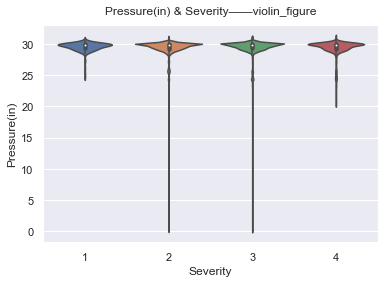

In [151]:
ax = sns.violinplot(x="Severity", y="Pressure(in)", data=model2019.sort_values("Severity"))
ax.set_title('Pressure(in) & Severity——violin_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Pressure(in) & Severity——KDE_figure')

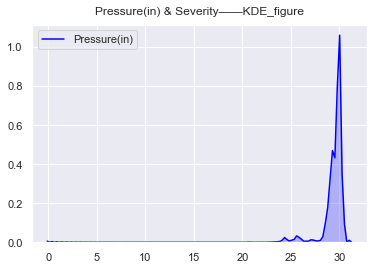

In [153]:
ax = sns.kdeplot(model2019['Pressure(in)'], shade=True, color="blue")
ax.set_title('Pressure(in) & Severity——KDE_figure', position=(0.5,1.02))

#### Visibility(mi)

Text(0.5, 1.02, 'Visibility(mi) & Severity——box_figure')

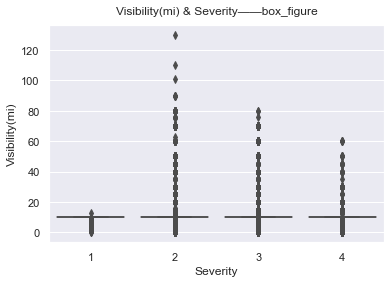

In [154]:
ax = sns.boxplot(x="Severity", y="Visibility(mi)", data= model2019.sort_values("Severity"))
ax.set_title('Visibility(mi) & Severity——box_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Visibility(mi) & Severity——KDE_figure')

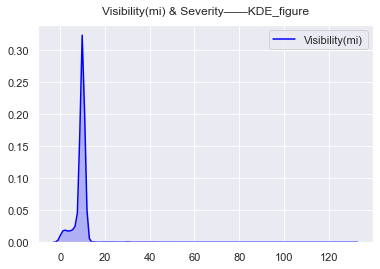

In [156]:
ax = sns.kdeplot(model2019['Visibility(mi)'], shade=True, color="blue", bw=1.02)
ax.set_title('Visibility(mi) & Severity——KDE_figure', position=(0.5,1.02))

#### Wind_Speed(mph)

Text(0.5, 1.02, 'Wind_Speed(mph) & Severity——box_figure')

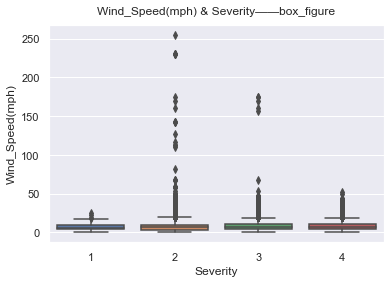

In [157]:
ax = sns.boxplot(x="Severity", y="Wind_Speed(mph)", data=model2019.sort_values("Severity"))
ax.set_title('Wind_Speed(mph) & Severity——box_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Wind_Speed(mph) & Severity——KDE_figure')

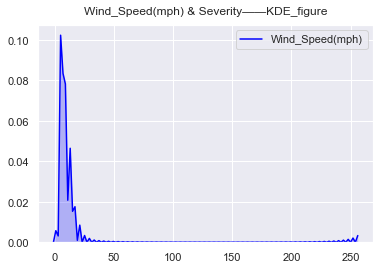

In [158]:
ax = sns.kdeplot(model2019['Wind_Speed(mph)'], shade=True, color="blue")
ax.set_title('Wind_Speed(mph) & Severity——KDE_figure', position=(0.5,1.02))

#### Precipitation(in)

Text(0.5, 1.02, 'Precipitation(in) & Severity——box_figure')

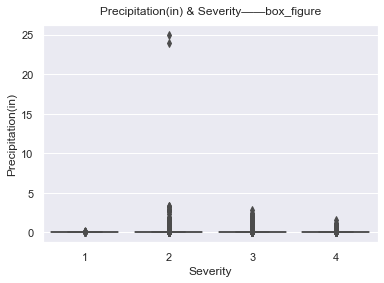

In [178]:
ax = sns.boxplot(x="Severity", y="Precipitation(in)", data=model2019.sort_values("Severity"))
ax.set_title('Precipitation(in) & Severity——box_figure', position=(0.5,1.02))

Text(0.5, 1.02, 'Precipitation(in) & Severity——KDE_figure')

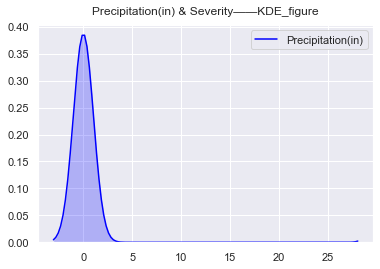

In [182]:
ax = sns.kdeplot(model2019['Precipitation(in)'], shade=True, color="blue", bw=1.02)
ax.set_title('Precipitation(in) & Severity——KDE_figure', position=(0.5,1.02))

#### 绘制连续型变量pairplot

D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
D:\anaconda\setup\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping dens

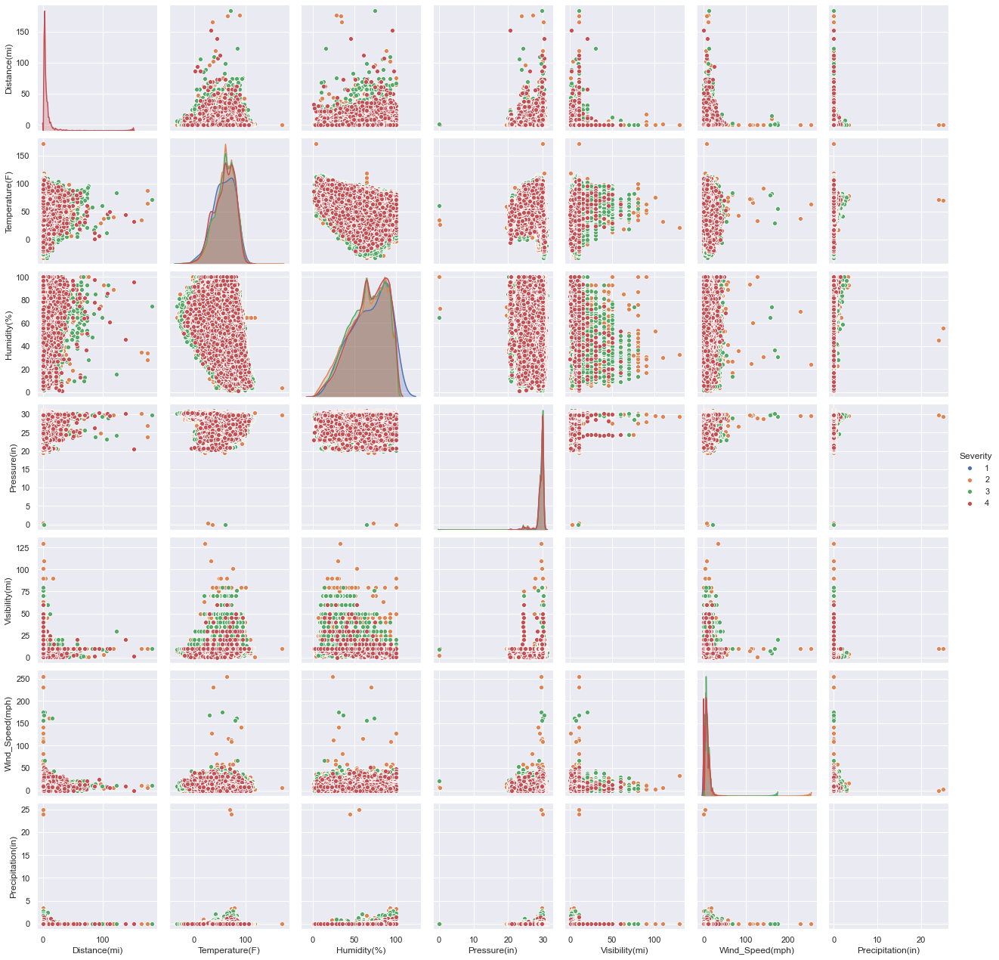

In [183]:
joint_data_2019 = model2019[["Severity", 'Distance(mi)', 'Temperature(F)','Humidity(%)',"Pressure(in)",
                             "Visibility(mi)","Wind_Speed(mph)",'Precipitation(in)']]
ax = sns.pairplot(joint_data_2019, hue="Severity",diag_kind='kde')
# ax.set_title('continous_pairplot', position=(0.5,1.02))

#### 连续型变量与事故数量之间的相关性热力图

In [185]:
list1 = ['Temperature(F)','Wind_Chill(F)','Humidity(%)','Pressure(in)','Visibility(mi)','Wind_Speed(mph)','Precipitation(in)']
data_corr = model2019[list1]
df_corr = data_corr.corr()
df_corr

,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
Temperature(F),1.000000,0.948401,-0.359634,-0.077141,0.200760,-0.023469,-0.009538
Wind_Chill(F),0.948401,1.000000,-0.318376,-0.051534,0.192811,-0.075352,-0.008255
Humidity(%),-0.359634,-0.318376,1.000000,0.171025,-0.386491,-0.146735,0.110091
Pressure(in),-0.077141,-0.051534,0.171025,1.000000,-0.080417,-0.022206,0.002210
Visibility(mi),0.200760,0.192811,-0.386491,-0.080417,1.000000,0.002872,-0.158281
Wind_Speed(mph),-0.023469,-0.075352,-0.146735,-0.022206,0.002872,1.000000,0.031752
Precipitation(in),-0.009538,-0.008255,0.110091,0.002210,-0.158281,0.031752,1.000000


In [186]:
df_corr['accident_count'] = [0.269938, 0.289085, 0.730457, 0.469698, -0.057681, -0.32169, -0.037913]
series = pd.Series({'Temperature(F)':0.269938, 
                    'Wind_Chill(F)':0.289085, 
                    'Humidity(%)':0.730457, 
                    'Pressure(in)':0.469698, 
                    'Visibility(mi)':-0.057681, 
                    'Wind_Speed(mph)':-0.32169, 
                    'Precipitation(in)':-0.037913,
                    'accident_count':1.000000},
                   name="accident_count")
df_corr = df_corr.append(series)
df_corr

,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),accident_count
Temperature(F),1.000000,0.948401,-0.359634,-0.077141,0.200760,-0.023469,-0.009538,0.269938
Wind_Chill(F),0.948401,1.000000,-0.318376,-0.051534,0.192811,-0.075352,-0.008255,0.289085
Humidity(%),-0.359634,-0.318376,1.000000,0.171025,-0.386491,-0.146735,0.110091,0.730457
Pressure(in),-0.077141,-0.051534,0.171025,1.000000,-0.080417,-0.022206,0.002210,0.469698
Visibility(mi),0.200760,0.192811,-0.386491,-0.080417,1.000000,0.002872,-0.158281,-0.057681
Wind_Speed(mph),-0.023469,-0.075352,-0.146735,-0.022206,0.002872,1.000000,0.031752,-0.321690
Precipitation(in),-0.009538,-0.008255,0.110091,0.002210,-0.158281,0.031752,1.000000,-0.037913
accident_count,0.269938,0.289085,0.730457,0.469698,-0.057681,-0.321690,-0.037913,1.000000


[Text(0.5, 0, 'Temperature(F)'),
 Text(1.5, 0, 'Wind_Chill(F)'),
 Text(2.5, 0, 'Humidity(%)'),
 Text(3.5, 0, 'Pressure(in)'),
 Text(4.5, 0, 'Visibility(mi)'),
 Text(5.5, 0, 'Wind_Speed(mph)'),
 Text(6.5, 0, 'Precipitation(in)'),
 Text(7.5, 0, 'accident_count')]

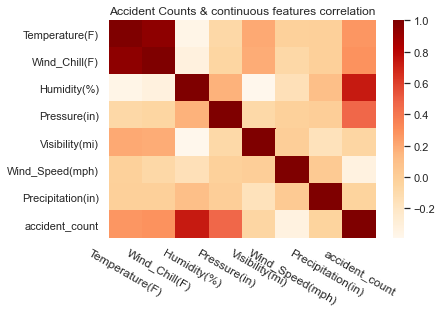

In [188]:
sns.set_style('dark')
ax = sns.heatmap(df_corr, cmap='OrRd')
ax.set_title('Accident Counts & continuous features correlation', position=(0.5,1.02))
ax.set_xticklabels(df_corr.index, rotation=330, fontsize=12)

### 类别型变量EDA

#### Weather_Condition

In [192]:
[i for i in model2019['Weather_Condition'].value_counts().index]

['Fair',
 'Mostly Cloudy',
 'Cloudy',
 'Partly Cloudy',
 'Clear',
 'Overcast',
 'Light Rain',
 'Light Snow',
 'Scattered Clouds',
 'Fog',
 'Rain',
 'Haze',
 'Heavy Rain',
 'Fair / Windy',
 'Light Drizzle',
 'T-Storm',
 'Thunder in the Vicinity',
 'Cloudy / Windy',
 'Mostly Cloudy / Windy',
 'Snow',
 'Light Rain with Thunder',
 'Thunder',
 'Partly Cloudy / Windy',
 'Heavy T-Storm',
 'Light Rain / Windy',
 'Light Freezing Rain',
 'Wintry Mix',
 'Patches of Fog',
 'Drizzle',
 'Mist',
 'Smoke',
 'Light Snow / Windy',
 'Heavy Snow',
 'Light Freezing Drizzle',
 'Shallow Fog',
 'Light Freezing Fog',
 'Rain / Windy',
 'Showers in the Vicinity',
 'N/A Precipitation',
 'Heavy Rain / Windy',
 'Heavy T-Storm / Windy',
 'Light Thunderstorms and Rain',
 'T-Storm / Windy',
 'Blowing Snow',
 'Thunderstorms and Rain',
 'Heavy Drizzle',
 'Thunder / Windy',
 'Haze / Windy',
 'Drizzle and Fog',
 'Blowing Dust / Windy',
 'Fog / Windy',
 'Heavy Thunderstorms and Rain',
 'Light Rain Shower',
 'Light Ice Pell

Text(0.5, 1.02, 'weather condition & severity')

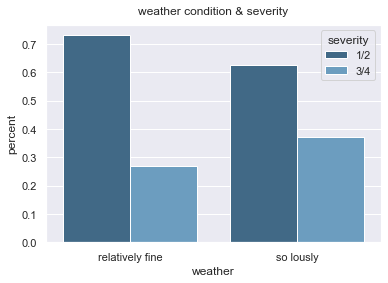

In [195]:
# 选择较好的天气和极端天气的数据进行对比
weather_test = pd.DataFrame({
    'weather':['relatively fine','relatively fine','so lously', 'so lously'],
    'severity':['1/2','3/4','1/2','3/4'],
    'percent':[0.731414039,0.268362808,0.627626824,0.371971624]
})
sns.set_style('darkgrid')
ax = sns.barplot(x="weather", y='percent', hue='severity', palette="Blues_d", data=weather_test)
# ax = sns.catplot(x="year", kind="count", , data=data_all)
ax.set_title('weather condition & severity', position=(0.5,1.02))

#### 交通标识

[Text(0, 0, 'Traffic_Signal'),
 Text(0, 0, 'Crossing'),
 Text(0, 0, 'Junction'),
 Text(0, 0, 'Station'),
 Text(0, 0, 'Stop'),
 Text(0, 0, 'Amenity'),
 Text(0, 0, 'Railway'),
 Text(0, 0, 'Give_Way'),
 Text(0, 0, 'No_Exit'),
 Text(0, 0, 'Traffic_Calming'),
 Text(0, 0, 'Bump'),
 Text(0, 0, 'Roundabout'),
 Text(0, 0, 'Turning_Loop')]

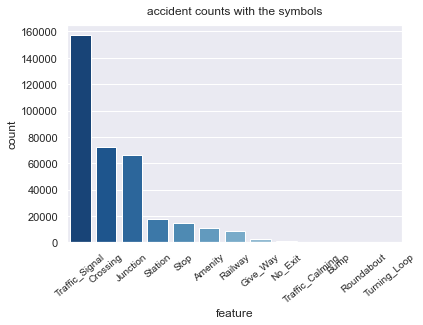

In [207]:
# 交通标识与事故数量之间的关系
isbool = [False, True,False, True,False, True,False, True,False, True,False, True,False, 
          True,False, True,False, True,False, True,False, True,False, True,False, True]
feature = ['Amenity','Amenity','Bump','Bump','Crossing','Crossing','Give_Way','Give_Way','Junction','Junction','No_Exit',
           'No_Exit','Railway','Railway','Roundabout','Roundabout','Station','Station',
           'Stop','Stop','Traffic_Calming','Traffic_Calming','Traffic_Signal','Traffic_Signal','Turning_Loop','Turning_Loop']
count = [943048,10685,953539,194,881105,72628,951082,2651,887289,
         66444,952483,1250,945208,8525,953680,53,936149,17584,938848,14885,953326,407,796591,157142,953733,0]
allount = [953733] * 26

df_cat = pd.DataFrame({
    'isbool':isbool,
    'feature':feature,
    'count':count,
    'allcount':allount
})
data_ana = df_cat[df_cat['isbool']==True]
data = data_ana.sort_values('count',ascending=False)
ax = sns.barplot(x='feature', y='count', data=data, palette='Blues_r')
ax.set_title('accident counts with the symbols', position=(0.5,1.02))
ax.set_xticklabels(data.feature, rotation=40, fontsize=10)

In [208]:
# 交通标识与事故程度之间的关系
list2 = list(set(['Amenity','Amenity','Bump','Bump','Crossing','Crossing','Give_Way','Give_Way','Junction','Junction','No_Exit',
           'No_Exit','Railway','Railway','Roundabout','Roundabout','Station','Station',
           'Stop','Stop','Traffic_Calming','Traffic_Calming','Traffic_Signal','Traffic_Signal','Turning_Loop','Turning_Loop']))
data_ana2 = model2019[['Severity']+list2]

def combine(x):
    if x == 1:
        return '1/2'
    elif x==2:
        return '1/2'
    else:
        return '3/4'

list3 = [] 

for i in list2:
    data = data_ana2[['Severity',i]]
    data['seve_combine'] = data['Severity'].apply(lambda x: combine(x))
    data2 =data[data[i]==True]
    list3.append(pd.DataFrame(data2['seve_combine'].value_counts()))

for i in range(len(list3)):
    list3[i]['all'] = list3[i]['seve_combine'].sum()
    list3[i]['percent'] = (list3[i]['seve_combine']/list3[i]['all']).apply(lambda x:round(x, 4))
    list3[i]['feature'] = list2[i]

data_all = pd.concat(list3)
data_all['severity_combine'] = data_all.index

data_all_sorted = data_all.sort_values('all', ascending=False)
data_all_sortedb


<ipython-input-208-bfd85063d013>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['seve_combine'] = data['Severity'].apply(lambda x: combine(x))


,seve_combine,all,percent,feature,severity_combine
3/4,12797,157142,0.0814,Traffic_Signal,3/4
1/2,144345,157142,0.9186,Traffic_Signal,1/2
1/2,67283,72628,0.9264,Crossing,1/2
3/4,5345,72628,0.0736,Crossing,3/4
1/2,41243,66444,0.6207,Junction,1/2
3/4,25201,66444,0.3793,Junction,3/4
3/4,1667,17584,0.0948,Station,3/4
1/2,15917,17584,0.9052,Station,1/2
1/2,13897,14885,0.9336,Stop,1/2
3/4,988,14885,0.0664,Stop,3/4


[Text(0, 0, 'Traffic_Signal'),
 Text(0, 0, 'Crossing'),
 Text(0, 0, 'Junction'),
 Text(0, 0, 'Station'),
 Text(0, 0, 'Stop'),
 Text(0, 0, 'Amenity'),
 Text(0, 0, 'Railway'),
 Text(0, 0, 'Give_Way'),
 Text(0, 0, 'No_Exit'),
 Text(0, 0, 'Traffic_Calming'),
 Text(0, 0, 'Bump'),
 Text(0, 0, 'Roundabout')]

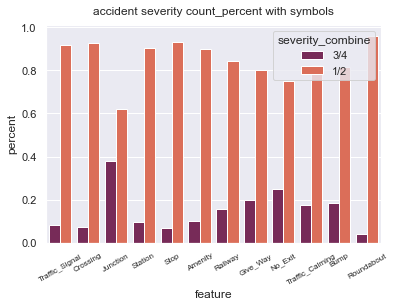

In [209]:
ax=sns.barplot(x="feature", y="percent", hue="severity_combine", data=data_all_sorted, palette='rocket')
ax.set_title('accident severity count_percent with symbols', position=(0.5,1.02))
ax.set_xticklabels(['Traffic_Signal','Crossing','Junction','Station',
                    'Stop','Amenity','Railway','Give_Way','No_Exit','Traffic_Calming','Bump','Roundabout'],rotation=30, fontsize=8)

### LGBM建模

In [265]:
modeldata = model2019.copy()

In [266]:
list(modeldata)

['Severity',
 'Start_Lat',
 'Start_Lng',
 'Distance(mi)',
 'Temperature(F)',
 'Wind_Chill(F)',
 'Humidity(%)',
 'Pressure(in)',
 'Visibility(mi)',
 'Wind_Direction',
 'Wind_Speed(mph)',
 'Precipitation(in)',
 'Weather_Condition',
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal',
 'Turning_Loop',
 'time',
 'weekday',
 'month',
 'hour']

In [268]:
# 做pandas.concat()操作时，尤其注意两个dataframe的索引是否对齐，否则concat的结果有差错
modeldata.index = range(len(modeldata))

In [270]:
modeldata.head()

,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,time,weekday,month,hour
0,3,40.884850,-95.800362,1.63,31.0,31.0,85.0,28.84,10.0,Calm,...,False,False,False,False,False,False,2019-12-26 17:09:52,Thursday,12,17
1,3,40.889641,-95.798630,1.67,31.0,31.0,85.0,28.84,10.0,Calm,...,False,False,False,False,False,False,2019-12-26 17:10:32,Thursday,12,17
2,3,42.313499,-83.091225,0.00,28.0,17.0,92.0,29.06,7.0,WSW,...,False,False,False,False,False,False,2019-12-31 23:49:36,Tuesday,12,23
3,2,42.398125,-83.109009,0.00,28.0,17.0,92.0,29.06,7.0,WSW,...,False,False,False,False,False,False,2019-12-31 23:50:02,Tuesday,12,23
4,2,39.754967,-75.276283,0.00,43.0,36.0,53.0,29.68,10.0,WNW,...,False,False,False,False,False,False,2019-12-31 23:29:03,Tuesday,12,23


#### 特征标准化与编码

In [271]:
modeldata.shape

(953733, 30)

In [272]:
continuous_feature = ['Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)','Wind_Speed(mph)', 'Precipitation(in)']
toLabeled_features = ['Wind_Direction','Weather_Condition']
to_01_features = ['Amenity', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Signal']

In [273]:
# 对类别型变量进行true/false转换
m = lambda x : 1 if x else 0
for feature in to_01_features:
    modeldata[feature] = modeldata[feature].apply(m)

In [274]:
# 对连续型变量进行标准化

stds = StandardScaler()
modeldata[continuous_feature] = pd.DataFrame(stds.fit_transform(modeldata[continuous_feature]),columns=continuous_feature)

In [275]:
# 将weekday转换为数字
def changetonum(weekday):
    if weekday == 'Monday':
        return int(1)
    elif weekday == 'Tuesday':
        return int(2)
    elif weekday == 'Wednesday':
        return int(3)
    elif weekday == 'Thursday':
        return int(4)
    elif weekday == 'Friday':
        return int(5)
    elif weekday == 'Saturday':
        return int(6)
    elif weekday == 'Sunday':
        return int(7)


modeldata['weekday'] = modeldata['weekday'].apply(lambda x:changetonum(x))

In [276]:
modeldata.shape

(953733, 30)

In [277]:
modeldata.head()

,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,time,weekday,month,hour
0,3,40.884850,-95.800362,1.63,-1.540303,31.0,0.887112,-0.537219,0.327484,Calm,...,False,0,0,False,0,False,2019-12-26 17:09:52,4,12,17
1,3,40.889641,-95.798630,1.67,-1.540303,31.0,0.887112,-0.537219,0.327484,Calm,...,False,0,0,False,0,False,2019-12-26 17:10:32,4,12,17
2,3,42.313499,-83.091225,0.00,-1.695655,17.0,1.198151,-0.336689,-0.729093,WSW,...,False,0,0,False,0,False,2019-12-31 23:49:36,2,12,23
3,2,42.398125,-83.109009,0.00,-1.695655,17.0,1.198151,-0.336689,-0.729093,WSW,...,False,0,0,False,0,False,2019-12-31 23:50:02,2,12,23
4,2,39.754967,-75.276283,0.00,-0.918894,36.0,-0.534785,0.228439,0.327484,WNW,...,False,0,0,False,0,False,2019-12-31 23:29:03,2,12,23


In [278]:
to_labeled_data = modeldata[toLabeled_features]
changed_data = []

# 开始独热编码并进行pca降维
for feature in toLabeled_features:
    data = to_labeled_data[feature]
    enc = OneHotEncoder(categories='auto',handle_unknown='ignore').fit(data.values.reshape(-1,1))
    result = enc.transform(data.values.reshape(-1,1)).toarray()
    data1=pd.DataFrame(result)
    
    pca=PCA(n_components=5) 
    pca.fit(data1)
    col = pca.transform(data1)
    data2 = pd.DataFrame(col)
    
    data2 = data2.rename(columns={0:feature+'_0',1:feature+'_1',2:feature+'_2',
                                  3:feature+'_3',4:feature+'_4'})
    changed_data.append(data2)

wind_data = changed_data[0]
weather_data = changed_data[1]

In [279]:
print(wind_data.shape, weather_data.shape)

(953733, 5) (953733, 5)


In [280]:
part_data = modeldata[['Severity', 'Start_Lat', 'Start_Lng', 'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 
                       'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Amenity', 'Crossing', 'Give_Way',
                       'Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Signal', 'month', 'hour', 'weekday',]]

In [281]:
part_data.index

RangeIndex(start=0, stop=953733, step=1)

In [282]:
part_data.shape

(953733, 21)

In [283]:
model2019_data = pd.concat([part_data, wind_data, weather_data], axis=1)

In [287]:
model2019_data.shape

(953733, 31)

In [288]:
# 去掉标签为1的数据
model_2019_final = model2019_data.drop(index=(model2019_data.loc[(model2019_data['Severity']==1)].index))
model_2019_final.index = range(len(model_2019_final))

def change(x):
    if x == 2:
        return int(0)
    elif x == 3:
        return int(1)
    else:
        return int(2)

model_2019_final['Severity'] = model_2019_final['Severity'].apply(lambda x:change(x))

In [289]:
model_2019_final.shape

(953530, 31)

#### 划分数据集

In [290]:
y = model_2019_final['Severity']
X = model_2019_final.drop(['Severity'], axis=1)

In [305]:
# 采用StratifiedKFold分层采样，划分训练集、测试集

sfolder = StratifiedKFold(n_splits=5, shuffle=True,random_state=0)
for train_index, test_index in sfolder.split(X, y):
    x_train = X.loc[train_index]
    y_train = y[train_index]
    
    x_test = X.loc[test_index]
    y_test = y[test_index]
    
    break

In [306]:
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

(762824, 30) (762824,) (190706, 30) (190706,)


In [310]:
y_train.value_counts()

0    550132
1    190235
2     22457
Name: Severity, dtype: int64

In [311]:
y_test.value_counts()

0    137533
1     47559
2      5614
Name: Severity, dtype: int64

#### 严重程度建模预测baseline

##### 建模

In [313]:
def lgb_model(clf, train_x, train_y, test_x, test_y, clf_name):
    train_matrix = clf.Dataset(train_x, label=train_y)
    valid_matrix = clf.Dataset(test_x, label=test_y)

    params = {
        'boosting_type': 'gbdt',
        'objective': 'multiclass',
#           'metric': 'multi_logloss',
        'min_child_weight': 5,
        'num_leaves': 2 ** 5,
        'lambda_l2': 10,
        'feature_fraction': 0.8,
        'bagging_fraction': 0.8,
        'bagging_freq': 4,
        'learning_rate': 0.03,
        'seed': 2020,
        'nthread': 28,
        'silent': True,
        'verbose': -1,
        'num_class': 3
    }

    model = clf.train(params, train_matrix, 10000, valid_sets=[train_matrix, valid_matrix], verbose_eval=200,early_stopping_rounds=200)
    val_pred = model.predict(test_x, num_iteration=model.best_iteration)
        
    val_predict = np.argmax(val_pred, axis=1)  # 获得最大概率对应的标签
        
    scores_ovr = metrics.roc_auc_score(test_y, val_pred, average='weighted', multi_class='ovr')
    scores_ovo = metrics.roc_auc_score(test_y, val_pred, average='weighted', multi_class='ovo')
        
    print('auc_ovr值： ', scores_ovr)
    print('auc_ovo值:  ', scores_ovo)
        
    print('分类报告: ')
    print(metrics.classification_report(test_y, val_predict))
        
    # 保存模型
    pkl.dump(model, open('model_lgb.pkl', 'wb'))
    print('model saved done')
        
    # 画出特征重要性
    names = model.feature_name()
    importance = list(model.feature_importance())
    print('特征名称: ')
    print(names)
    print('特征重要性: ')
    print(importance)
    
    return names, importance 
    
feature_names, feature_importace = lgb_model(lgb, x_train, y_train, x_test, y_test, 'lgbm')

D:\anaconda\setup\lib\site-packages\lightgbm\basic.py:792: UserWarning: silent keyword has been found in `params` and will be ignored.
Please use silent argument of the Dataset constructor to pass this parameter.
  warnings.warn('{0} keyword has been found in `params` and will be ignored.\n'


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.54386	valid_1's multi_logloss: 0.54568
[400]	training's multi_logloss: 0.525941	valid_1's multi_logloss: 0.529322
[600]	training's multi_logloss: 0.516105	valid_1's multi_logloss: 0.521
[800]	training's multi_logloss: 0.508655	valid_1's multi_logloss: 0.515083
[1000]	training's multi_logloss: 0.502357	valid_1's multi_logloss: 0.510202
[1200]	training's multi_logloss: 0.496499	valid_1's multi_logloss: 0.505849
[1400]	training's multi_logloss: 0.491547	valid_1's multi_logloss: 0.502373
[1600]	training's multi_logloss: 0.487247	valid_1's multi_logloss: 0.499524
[1800]	training's multi_logloss: 0.483039	valid_1's multi_logloss: 0.496749
[2000]	training's multi_logloss: 0.479001	valid_1's multi_logloss: 0.494104
[2200]	training's multi_logloss: 0.47546	valid_1's multi_logloss: 0.491923
[2400]	training's multi_logloss: 0.472195	valid_1's multi_logloss: 0.489992
[2600]	training's multi_logloss: 0.4

##### 绘制特征重要性图

In [317]:
feature_plot = pd.DataFrame({
    'feature':feature_names,
    'importance':feature_importace
})

In [325]:
feature_plot.sort_values('importance', inplace=True, ascending=False)

In [326]:
feature_plot

,feature,importance
0,Start_Lat,144527
1,Start_Lng,142821
4,Pressure(in),90910
2,Temperature(F),77225
3,Humidity(%),72173
18,hour,68482
6,Wind_Speed(mph),49128
17,month,40495
19,weekday,38383
20,Wind_Direction_0,23397


<function matplotlib.pyplot.show(*args, **kw)>

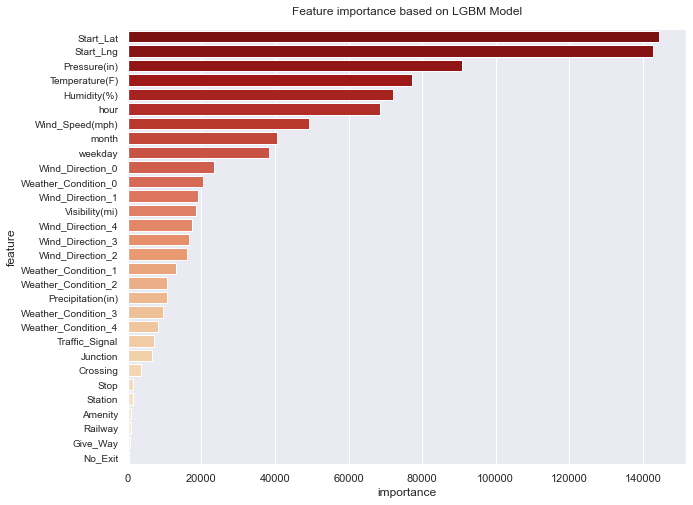

In [327]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='importance', y='feature', data=feature_plot, palette='OrRd_r')
ax.set_title('Feature importance based on LGBM Model', position=(0.5,1.02))
ax.set_yticklabels(feature_plot.feature, fontsize=10)
plt.show

#### 提升1: 升采样SMOTE

##### SMOTE升采样

In [330]:
oversample = SMOTE()
X_resampled, y_resampled = oversample.fit_resample(x_train, y_train)

In [331]:
print(X_resampled.shape, y_resampled.shape)
print(y_resampled.value_counts())

(1650396, 30) (1650396,)
2    550132
1    550132
0    550132
Name: Severity, dtype: int64


##### 建模

In [332]:
def lgb_model(clf, train_x, train_y, test_x, test_y, clf_name):
    train_matrix = clf.Dataset(train_x, label=train_y)
    valid_matrix = clf.Dataset(test_x, label=test_y)

    params = {
        'boosting_type': 'gbdt',
        'objective': 'multiclass',
#           'metric': 'multi_logloss',
        'min_child_weight': 5,
        'num_leaves': 2 ** 5,
        'lambda_l2': 10,
        'feature_fraction': 0.8,
        'bagging_fraction': 0.8,
        'bagging_freq': 4,
        'learning_rate': 0.03,
        'seed': 2020,
        'nthread': 28,
        'silent': True,
        'verbose': -1,
        'num_class': 3
    }

    model = clf.train(params, train_matrix, 10000, valid_sets=[train_matrix, valid_matrix], verbose_eval=200,early_stopping_rounds=200)
    val_pred = model.predict(test_x, num_iteration=model.best_iteration)
        
    val_predict = np.argmax(val_pred, axis=1)  # 获得最大概率对应的标签
        
    scores_ovr = metrics.roc_auc_score(test_y, val_pred, average='weighted', multi_class='ovr')
    scores_ovo = metrics.roc_auc_score(test_y, val_pred, average='weighted', multi_class='ovo')
        
    print('auc_ovr值： ', scores_ovr)
    print('auc_ovo值:  ', scores_ovo)
        
    print('分类报告: ')
    print(metrics.classification_report(test_y, val_predict))
        
    # 保存模型
    pkl.dump(model, open('model_lgb.pkl', 'wb'))
    print('model saved done')
        
    # 画出特征重要性
    names = model.feature_name()
    importance = list(model.feature_importance())
    print('特征名称: ')
    print(names)
    print('特征重要性: ')
    print(importance)
    
    return names, importance 
    
feature_names, feature_importace = lgb_model(lgb, X_resampled, y_resampled, x_test, y_test, 'lgbm')

D:\anaconda\setup\lib\site-packages\lightgbm\basic.py:792: UserWarning: silent keyword has been found in `params` and will be ignored.
Please use silent argument of the Dataset constructor to pass this parameter.
  warnings.warn('{0} keyword has been found in `params` and will be ignored.\n'


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.699573	valid_1's multi_logloss: 0.683637
[400]	training's multi_logloss: 0.631594	valid_1's multi_logloss: 0.624647
[600]	training's multi_logloss: 0.600876	valid_1's multi_logloss: 0.601853
[800]	training's multi_logloss: 0.580266	valid_1's multi_logloss: 0.587905
[1000]	training's multi_logloss: 0.565226	valid_1's multi_logloss: 0.578683
[1200]	training's multi_logloss: 0.551733	valid_1's multi_logloss: 0.570454
[1400]	training's multi_logloss: 0.5405	valid_1's multi_logloss: 0.564063
[1600]	training's multi_logloss: 0.530748	valid_1's multi_logloss: 0.558965
[1800]	training's multi_logloss: 0.521507	valid_1's multi_logloss: 0.553767
[2000]	training's multi_logloss: 0.513178	valid_1's multi_logloss: 0.549621
[2200]	training's multi_logloss: 0.505678	valid_1's multi_logloss: 0.545689
[2400]	training's multi_logloss: 0.498727	valid_1's multi_logloss: 0.542151
[2600]	training's multi_logloss:

##### 绘制特征重要性图

<function matplotlib.pyplot.show(*args, **kw)>

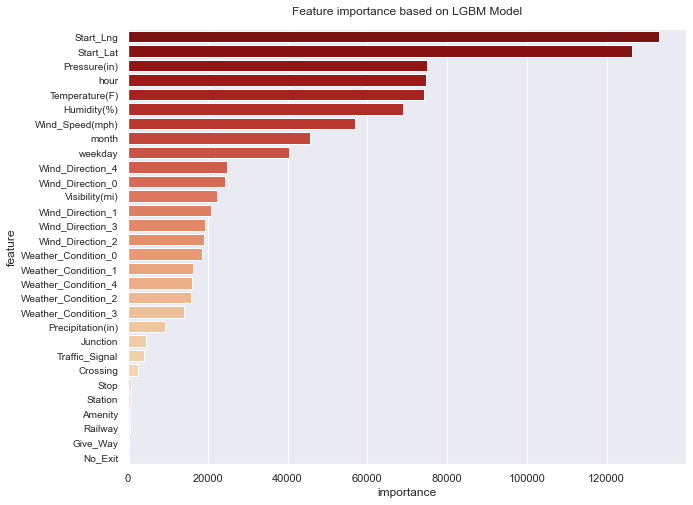

In [333]:
feature_plot = pd.DataFrame({
    'feature':feature_names,
    'importance':feature_importace
})

feature_plot.sort_values('importance', inplace=True, ascending=False)
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='importance', y='feature', data=feature_plot, palette='OrRd_r')
ax.set_title('Feature importance based on LGBM Model', position=(0.5,1.02))
ax.set_yticklabels(feature_plot.feature, fontsize=10)
plt.show

#### 提升2: 升采样+贝叶斯调参

In [5]:
data2019 = pd.read_csv('./data/2019.csv', encoding='utf-8-sig')

In [16]:
data_model = data2019[['Severity','Start_Lat', 'Start_Lng','Temperature(F)','Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 
                     'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition','Amenity', 'Crossing', 
                     'Give_Way','Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Signal','time']]



In [18]:
data_model.isnull().sum()

Severity                  0
Start_Lat                 0
Start_Lng                 0
Temperature(F)        17137
Humidity(%)           18219
Pressure(in)          13747
Visibility(mi)        18435
Wind_Direction        19926
Wind_Speed(mph)       60043
Precipitation(in)    219097
Weather_Condition     18237
Amenity                   0
Crossing                  0
Give_Way                  0
Junction                  0
No_Exit                   0
Railway                   0
Station                   0
Stop                      0
Traffic_Signal            0
time                      0
dtype: int64

In [20]:
# 类别型缺失值用众数填充
data_model['Wind_Direction'] = data_model['Wind_Direction'].fillna('CALM')
data_model['Weather_Condition'] = data_model['Weather_Condition'].fillna('Fair')

# 连续型变量缺失值填充
#温度湿度气压能见度用均值填补
data_model['Temperature(F)'] = data_model['Temperature(F)'].fillna(data_model['Temperature(F)'].mean())
data_model['Humidity(%)'] = data_model['Humidity(%)'].fillna(data_model['Humidity(%)'].mean())
data_model['Pressure(in)'] = data_model['Pressure(in)'].fillna(data_model['Pressure(in)'].mean())
data_model['Visibility(mi)'] = data_model['Visibility(mi)'].fillna(data_model['Visibility(mi)'].mean())
#风速使用近邻填补
data_model['Wind_Speed(mph)'] = data_model['Wind_Speed(mph)'].interpolate(method='nearest', order=4)

#降水量没有就用0填补
data_model['Precipitation(in)'] = data_model['Precipitation(in)'].fillna(0)
#风向，把同样含义单词的合并起来
occupation = {"CALM":"Calm", "N":"North", "S":"South", "W":"West", "E":"East", "VAR":"Variable"}
f = lambda x : occupation.get(x,x) #在occupation中找对应的值
data_model['Wind_Direction']= data_model['Wind_Direction'].map(f)

<ipython-input-20-505279eae13c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_model['Wind_Direction'] = data_model['Wind_Direction'].fillna('CALM')
<ipython-input-20-505279eae13c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_model['Weather_Condition'] = data_model['Weather_Condition'].fillna('Fair')
<ipython-input-20-505279eae13c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [25]:
def get_week_day(date):
    week_day_dict = {
    0 : 1,
    1 : 2,
    2 : 3,
    3 : 4,
    4 : 5,
    5 : 6,
    6 : 7,
  }
    day = date.weekday()
    return week_day_dict[day]

def get_weekday(time):
    time = datetime.strptime(time, '%Y-%m-%d %H:%M:%S')
    return get_week_day(time)

data_model['weekday'] = data_model['time'].apply(lambda x:get_weekday(x))
data_model['month'] = pd.DatetimeIndex(data_model["time"]).month
data_model['hour'] = pd.DatetimeIndex(data_model["time"]).hour

<ipython-input-25-de81c67479c8>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_model['weekday'] = data_model['time'].apply(lambda x:get_weekday(x))
<ipython-input-25-de81c67479c8>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_model['month'] = pd.DatetimeIndex(data_model["time"]).month
<ipython-input-25-de81c67479c8>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [26]:
data_model.head()

,Severity,Start_Lat,Start_Lng,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),...,Junction,No_Exit,Railway,Station,Stop,Traffic_Signal,time,weekday,month,hour
0,3,40.884850,-95.800362,31.0,85.0,28.84,10.0,Calm,0.0,0.0,...,False,False,False,False,False,False,2019-12-26 17:09:52,4,12,17
1,3,40.889641,-95.798630,31.0,85.0,28.84,10.0,Calm,0.0,0.0,...,False,False,False,False,False,False,2019-12-26 17:10:32,4,12,17
2,3,42.313499,-83.091225,28.0,92.0,29.06,7.0,WSW,13.0,0.0,...,False,False,False,False,False,False,2019-12-31 23:49:36,2,12,23
3,2,42.398125,-83.109009,28.0,92.0,29.06,7.0,WSW,13.0,0.0,...,False,False,False,False,False,False,2019-12-31 23:50:02,2,12,23
4,2,39.754967,-75.276283,43.0,53.0,29.68,10.0,WNW,14.0,0.0,...,False,False,False,False,False,False,2019-12-31 23:29:03,2,12,23


In [27]:
data_model.isnull().sum()

Severity             0
Start_Lat            0
Start_Lng            0
Temperature(F)       0
Humidity(%)          0
Pressure(in)         0
Visibility(mi)       0
Wind_Direction       0
Wind_Speed(mph)      0
Precipitation(in)    0
Weather_Condition    0
Amenity              0
Crossing             0
Give_Way             0
Junction             0
No_Exit              0
Railway              0
Station              0
Stop                 0
Traffic_Signal       0
time                 0
weekday              0
month                0
hour                 0
dtype: int64

In [28]:
data_model.shape

(953733, 24)

In [29]:
continuous_feature = ['Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)','Wind_Speed(mph)', 'Precipitation(in)']
toLabeled_features = ['Wind_Direction','Weather_Condition']
to_01_features = ['Amenity', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Signal']

In [30]:
# 对类别型变量进行true/false转换
m = lambda x : 1 if x else 0
for feature in to_01_features:
    data_model[feature] = data_model[feature].apply(m)
    

# 对连续型变量进行标准化
stds = StandardScaler()
data_model[continuous_feature] = pd.DataFrame(stds.fit_transform(data_model[continuous_feature]),columns=continuous_feature)


to_labeled_data = data_model[toLabeled_features]
changed_data = []
# 开始独热编码并进行pca降维
for feature in toLabeled_features:
    data = to_labeled_data[feature]
    enc = OneHotEncoder(categories='auto',handle_unknown='ignore').fit(data.values.reshape(-1,1))
    result = enc.transform(data.values.reshape(-1,1)).toarray()
    data1=pd.DataFrame(result)
    
    pca=PCA(n_components=5) 
    pca.fit(data1)
    col = pca.transform(data1)
    data2 = pd.DataFrame(col)
    
    data2 = data2.rename(columns={0:feature+'_0',1:feature+'_1',2:feature+'_2',
                                  3:feature+'_3',4:feature+'_4'})
    changed_data.append(data2)

wind_data = changed_data[0]
weather_data = changed_data[1]

<ipython-input-30-d0968c4b257f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_model[feature] = data_model[feature].apply(m)
D:\anaconda\setup\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [31]:
part_data = data_model[['Severity', 'Start_Lat', 'Start_Lng', 'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 
                       'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Amenity', 'Crossing', 'Give_Way',
                       'Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Signal', 'month', 'hour', 'weekday',]]

In [33]:
model2019_data = pd.concat([part_data, wind_data, weather_data], axis=1)

In [34]:
model2019_data.shape

(953733, 31)

In [35]:
# 去掉标签为1的数据
model_2019_final = model2019_data.drop(index=(model2019_data.loc[(model2019_data['Severity']==1)].index))
model_2019_final.index = range(len(model_2019_final))

def change(x):
    if x == 2:
        return int(0)
    elif x == 3:
        return int(1)
    else:
        return int(2)

model_2019_final['Severity'] = model_2019_final['Severity'].apply(lambda x:change(x))

In [36]:
model_2019_final.shape

(953530, 31)

In [37]:
y = model_2019_final['Severity']
X = model_2019_final.drop(['Severity'], axis=1)

In [38]:
# 采用StratifiedKFold分层采样，划分训练集、测试集

sfolder = StratifiedKFold(n_splits=5, shuffle=True,random_state=0)
for train_index, test_index in sfolder.split(X, y):
    x_train = X.loc[train_index]
    y_train = y[train_index]
    
    x_test = X.loc[test_index]
    y_test = y[test_index]
    
    break

##### 升采样

In [40]:
oversample = SMOTE()
X_resampled, y_resampled = oversample.fit_resample(x_train, y_train)

##### 贝叶斯调参

In [47]:
# 采取贝叶斯调参的方法
# from sklearn.model_selection import cross_val_score
from bayes_opt import BayesianOptimization

"""定义优化函数"""


def rf_lgb(learning_rate,
           num_leaves,
           max_depth,
           min_data_in_leaf,
           min_child_weight,
           min_split_gain,
           reg_lambda,
           reg_alpha):

    params = {
        'boosting_type': 'gbdt',
        'objective': 'multiclass',
        'num_class': 3,
        'n_estimators': 5000,
        'learning_rate': learning_rate,
        'num_leaves': int(num_leaves),
        'max_depth': int(max_depth),
        'min_data_in_leaf': int(min_data_in_leaf),
        'min_child_weight': min_child_weight,
        'min_split_gain': min_split_gain,
        'reg_lambda': reg_lambda,
        'reg_alpha': reg_alpha
    }

    train_matrix = lgb.Dataset(X_resampled, label=y_resampled)
    valid_matrix = lgb.Dataset(x_test, label=y_test)

    model = lgb.train(params, train_matrix, 10000,
                      valid_sets=[train_matrix, valid_matrix], verbose_eval=200, early_stopping_rounds=200)

    val_pred = model.predict(x_test, num_iteration=model.best_iteration)
    val_predict = np.argmax(val_pred, axis=1)  # 获得最大概率对应的标签

    auc_ovr = metrics.roc_auc_score(y_test, val_pred, average='weighted', multi_class='ovr')
    
    print('auc-ovr:', metrics.roc_auc_score(y_test,
                                            val_pred, average='weighted', multi_class='ovr'))
    print('auc-ovo:', metrics.roc_auc_score(y_test,
                                            val_pred, average='weighted', multi_class='ovo'))
    print('分类报告: ')

    print(metrics.classification_report(y_test, val_predict))

    return auc_ovr


"""定义优化参数"""
bayes_lgb = BayesianOptimization(
    rf_lgb,
    {
        'learning_rate': (0.01, 0.1),
        'num_leaves': (10, 200),
        'max_depth': (3, 20),
        'min_data_in_leaf': (10, 100),
        'min_child_weight': (0, 10),
        'min_split_gain': (0.0, 1.0),
        'reg_alpha': (0.0, 10),
        'reg_lambda': (0.0, 10),
    }
)

"""开始优化"""
bayes_lgb.maximize(init_points=5, n_iter=5)

|   iter    |  target   | learni... | max_depth | min_ch... | min_da... | min_sp... | num_le... | reg_alpha | reg_la... |
-------------------------------------------------------------------------------------------------------------------------


D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.507181	valid_1's multi_logloss: 0.557881
[400]	training's multi_logloss: 0.43515	valid_1's multi_logloss: 0.5211
[600]	training's multi_logloss: 0.406234	valid_1's multi_logloss: 0.509782
[800]	training's multi_logloss: 0.394478	valid_1's multi_logloss: 0.506954
Early stopping, best iteration is:
[749]	training's multi_logloss: 0.394478	valid_1's multi_logloss: 0.506954
auc-ovr: 0.8433268138330061
auc-ovo: 0.8413510878850311
分类报告: 
              precision    recall  f1-score   support

           0       0.83      0.90      0.87    137533
           1       0.64      0.51      0.57     47559
           2       0.40      0.29      0.34      5614

    accuracy                           0.79    190706
   macro avg       0.62      0.57      0.59    190706
weighted avg       0.77      0.79      0.78    190706

|  1        |  0.8433   |  0.08522  |  12.11    |  6.279    |  38.45    |  0.7629   |  

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.927632	valid_1's multi_logloss: 0.912484
[400]	training's multi_logloss: 0.849952	valid_1's multi_logloss: 0.8302
[600]	training's multi_logloss: 0.803685	valid_1's multi_logloss: 0.781242
[800]	training's multi_logloss: 0.771159	valid_1's multi_logloss: 0.747093
[1000]	training's multi_logloss: 0.748304	valid_1's multi_logloss: 0.723808
[1200]	training's multi_logloss: 0.730363	valid_1's multi_logloss: 0.706413
[1400]	training's multi_logloss: 0.716814	valid_1's multi_logloss: 0.693377
[1600]	training's multi_logloss: 0.704995	valid_1's multi_logloss: 0.682683
[1800]	training's multi_logloss: 0.694692	valid_1's multi_logloss: 0.673569
[2000]	training's multi_logloss: 0.686488	valid_1's multi_logloss: 0.665909
[2200]	training's multi_logloss: 0.679606	valid_1's multi_logloss: 0.659731
[2400]	training's multi_logloss: 0.673216	valid_1's multi_logloss: 0.654108
[2600]	training's multi_logloss:

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.7804	valid_1's multi_logloss: 0.76013
[400]	training's multi_logloss: 0.703059	valid_1's multi_logloss: 0.683475
[600]	training's multi_logloss: 0.661763	valid_1's multi_logloss: 0.648118
[800]	training's multi_logloss: 0.636425	valid_1's multi_logloss: 0.628467
[1000]	training's multi_logloss: 0.619039	valid_1's multi_logloss: 0.61507
[1200]	training's multi_logloss: 0.606155	valid_1's multi_logloss: 0.605262
[1400]	training's multi_logloss: 0.595971	valid_1's multi_logloss: 0.597936
[1600]	training's multi_logloss: 0.587047	valid_1's multi_logloss: 0.591954
[1800]	training's multi_logloss: 0.579815	valid_1's multi_logloss: 0.586929
[2000]	training's multi_logloss: 0.573006	valid_1's multi_logloss: 0.58231
[2200]	training's multi_logloss: 0.566757	valid_1's multi_logloss: 0.578048
[2400]	training's multi_logloss: 0.561322	valid_1's multi_logloss: 0.57455
[2600]	training's multi_logloss: 0.5

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.795783	valid_1's multi_logloss: 0.775356
[400]	training's multi_logloss: 0.721499	valid_1's multi_logloss: 0.700829
[600]	training's multi_logloss: 0.677581	valid_1's multi_logloss: 0.661692
[800]	training's multi_logloss: 0.650444	valid_1's multi_logloss: 0.639116
[1000]	training's multi_logloss: 0.631945	valid_1's multi_logloss: 0.624391
[1200]	training's multi_logloss: 0.616927	valid_1's multi_logloss: 0.613339
[1400]	training's multi_logloss: 0.605741	valid_1's multi_logloss: 0.605218
[1600]	training's multi_logloss: 0.596792	valid_1's multi_logloss: 0.598482
[1800]	training's multi_logloss: 0.58923	valid_1's multi_logloss: 0.593072
[2000]	training's multi_logloss: 0.582458	valid_1's multi_logloss: 0.588232
[2200]	training's multi_logloss: 0.576279	valid_1's multi_logloss: 0.584206
[2400]	training's multi_logloss: 0.570602	valid_1's multi_logloss: 0.580113
[2600]	training's multi_logloss

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.88731	valid_1's multi_logloss: 0.869333
[400]	training's multi_logloss: 0.810327	valid_1's multi_logloss: 0.787457
[600]	training's multi_logloss: 0.761495	valid_1's multi_logloss: 0.737016
[800]	training's multi_logloss: 0.729983	valid_1's multi_logloss: 0.705379
[1000]	training's multi_logloss: 0.708446	valid_1's multi_logloss: 0.684983
[1200]	training's multi_logloss: 0.691498	valid_1's multi_logloss: 0.669665
[1400]	training's multi_logloss: 0.677468	valid_1's multi_logloss: 0.657576
[1600]	training's multi_logloss: 0.665516	valid_1's multi_logloss: 0.647743
[1800]	training's multi_logloss: 0.655634	valid_1's multi_logloss: 0.639966
[2000]	training's multi_logloss: 0.647041	valid_1's multi_logloss: 0.633489
[2200]	training's multi_logloss: 0.638935	valid_1's multi_logloss: 0.627793
[2400]	training's multi_logloss: 0.631525	valid_1's multi_logloss: 0.622496
[2600]	training's multi_logloss

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.492872	valid_1's multi_logloss: 0.548291
[400]	training's multi_logloss: 0.422266	valid_1's multi_logloss: 0.514838
[600]	training's multi_logloss: 0.380946	valid_1's multi_logloss: 0.500946
[800]	training's multi_logloss: 0.350776	valid_1's multi_logloss: 0.492353
[1000]	training's multi_logloss: 0.327495	valid_1's multi_logloss: 0.486342
[1200]	training's multi_logloss: 0.308339	valid_1's multi_logloss: 0.482227
[1400]	training's multi_logloss: 0.292552	valid_1's multi_logloss: 0.478789
[1600]	training's multi_logloss: 0.278905	valid_1's multi_logloss: 0.47656
[1800]	training's multi_logloss: 0.266211	valid_1's multi_logloss: 0.474909
[2000]	training's multi_logloss: 0.255548	valid_1's multi_logloss: 0.473243
[2200]	training's multi_logloss: 0.24521	valid_1's multi_logloss: 0.472085
[2400]	training's multi_logloss: 0.236166	valid_1's multi_logloss: 0.470928
[2600]	training's multi_logloss:

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.483127	valid_1's multi_logloss: 0.541253
[400]	training's multi_logloss: 0.414173	valid_1's multi_logloss: 0.51179
[600]	training's multi_logloss: 0.3764	valid_1's multi_logloss: 0.50037
[800]	training's multi_logloss: 0.347312	valid_1's multi_logloss: 0.490977
[1000]	training's multi_logloss: 0.323994	valid_1's multi_logloss: 0.484997
[1200]	training's multi_logloss: 0.304298	valid_1's multi_logloss: 0.480947
[1400]	training's multi_logloss: 0.287914	valid_1's multi_logloss: 0.477694
[1600]	training's multi_logloss: 0.273782	valid_1's multi_logloss: 0.475794
[1800]	training's multi_logloss: 0.261978	valid_1's multi_logloss: 0.474288
[2000]	training's multi_logloss: 0.251486	valid_1's multi_logloss: 0.47297
[2200]	training's multi_logloss: 0.242481	valid_1's multi_logloss: 0.47191
[2400]	training's multi_logloss: 0.233942	valid_1's multi_logloss: 0.471042
[2600]	training's multi_logloss: 0.2

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.548807	valid_1's multi_logloss: 0.582075
[400]	training's multi_logloss: 0.47099	valid_1's multi_logloss: 0.539403
[600]	training's multi_logloss: 0.426671	valid_1's multi_logloss: 0.518379
[800]	training's multi_logloss: 0.395298	valid_1's multi_logloss: 0.506182
[1000]	training's multi_logloss: 0.371442	valid_1's multi_logloss: 0.498928
[1200]	training's multi_logloss: 0.35184	valid_1's multi_logloss: 0.492683
[1400]	training's multi_logloss: 0.335438	valid_1's multi_logloss: 0.488644
[1600]	training's multi_logloss: 0.321564	valid_1's multi_logloss: 0.485009
[1800]	training's multi_logloss: 0.308809	valid_1's multi_logloss: 0.482012
[2000]	training's multi_logloss: 0.300634	valid_1's multi_logloss: 0.480568
[2200]	training's multi_logloss: 0.295349	valid_1's multi_logloss: 0.479712
[2400]	training's multi_logloss: 0.290733	valid_1's multi_logloss: 0.479169
[2600]	training's multi_logloss:

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.506619	valid_1's multi_logloss: 0.553615
[400]	training's multi_logloss: 0.442265	valid_1's multi_logloss: 0.522333
[600]	training's multi_logloss: 0.403426	valid_1's multi_logloss: 0.507997
[800]	training's multi_logloss: 0.37448	valid_1's multi_logloss: 0.498395
[1000]	training's multi_logloss: 0.351529	valid_1's multi_logloss: 0.491438
[1200]	training's multi_logloss: 0.339901	valid_1's multi_logloss: 0.488736
[1400]	training's multi_logloss: 0.332273	valid_1's multi_logloss: 0.487426
[1600]	training's multi_logloss: 0.325439	valid_1's multi_logloss: 0.486352
[1800]	training's multi_logloss: 0.319773	valid_1's multi_logloss: 0.485399
Early stopping, best iteration is:
[1796]	training's multi_logloss: 0.319773	valid_1's multi_logloss: 0.485399
auc-ovr: 0.8536672222557391
auc-ovo: 0.8504002723392602
分类报告: 
              precision    recall  f1-score   support

           0       0.84      0

D:\anaconda\setup\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


Training until validation scores don't improve for 200 rounds
[200]	training's multi_logloss: 0.584569	valid_1's multi_logloss: 0.600529
[400]	training's multi_logloss: 0.509701	valid_1's multi_logloss: 0.556251
[600]	training's multi_logloss: 0.464792	valid_1's multi_logloss: 0.534742
[800]	training's multi_logloss: 0.433211	valid_1's multi_logloss: 0.52216
[1000]	training's multi_logloss: 0.40897	valid_1's multi_logloss: 0.512462
[1200]	training's multi_logloss: 0.388938	valid_1's multi_logloss: 0.505306
[1400]	training's multi_logloss: 0.371792	valid_1's multi_logloss: 0.49989
[1600]	training's multi_logloss: 0.35637	valid_1's multi_logloss: 0.495341
[1800]	training's multi_logloss: 0.342784	valid_1's multi_logloss: 0.491501
[2000]	training's multi_logloss: 0.330674	valid_1's multi_logloss: 0.487967
[2200]	training's multi_logloss: 0.319925	valid_1's multi_logloss: 0.485879
[2400]	training's multi_logloss: 0.31038	valid_1's multi_logloss: 0.483925
[2600]	training's multi_logloss: 0.

In [48]:
bayes_lgb.max

{'target': 0.8625262244255872,
 'params': {'learning_rate': 0.0962708909450177,
  'max_depth': 13.00402916073642,
  'min_child_weight': 8.929222551009756,
  'min_data_in_leaf': 38.94556865766927,
  'min_split_gain': 0.021380546603955053,
  'num_leaves': 158.33757157633764,
  'reg_alpha': 8.099483940356155,
  'reg_lambda': 7.7850444171056665}}

# 事故数量时序预测建模